### import dependencies, tract geography


In [1]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from collections import OrderedDict

# Read in metro ATL Census tracts
atl_cts = gpd.read_file(
    'ARC_CTs.gpkg'
).to_crs(epsg=26967)

# pare down Census tracts
atl_cts = atl_cts[[
    'GEOID',
    'geometry'
]]

### determine optimal number of clusters


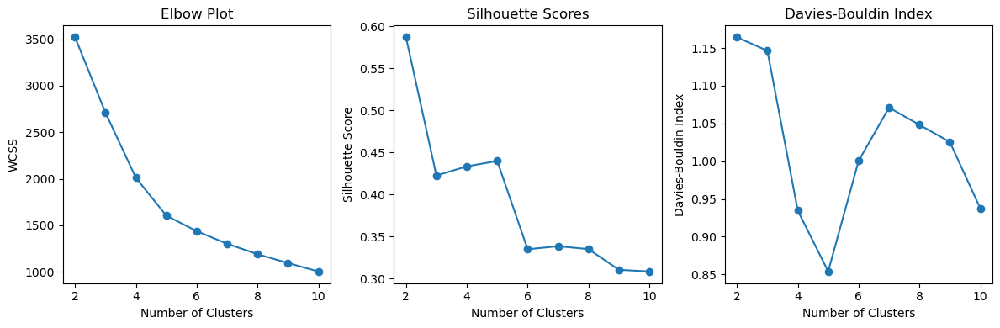

In [5]:
# read in data, set dtype
df = pd.read_csv('submarket_analysis.csv', dtype={'GEOID': 'str'})

# select variables from list of columns, assign weights to be applied later
columns_of_interest = {
    'pop_density': 1,
    'Job_to_pop_ratio': 1,
    '%_renter_occupied': 1,
    'FAR_avg': 1,
    # 'FAR_ATTOM': 1,
    # 'FAR_infutor': 1,
    # '%_units_20+_structures': 1,
    # '%_units_10+_structure': 1,
}

# create subset from initial dataframe, fillna with 0s
data_subset = df[columns_of_interest.keys()]
data_subset = data_subset.fillna(0)

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_subset)

# Apply weights to the scaled data
weights = list(columns_of_interest.values())
weighted_data = scaled_data * weights

# Calculate WCSS for a range of cluster numbers
wcss = []
silhouette_scores = []
davies_bouldin_indices = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, max_iter=500, n_init=100)
    kmeans.fit(weighted_data)
    wcss.append(kmeans.inertia_)

    # Silhouette score
    silhouette_avg = silhouette_score(weighted_data, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

    # Davies-Bouldin index
    db_index = davies_bouldin_score(weighted_data, kmeans.labels_)
    davies_bouldin_indices.append(db_index)

# Plot the elbow plot
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(K, wcss, marker='o')
plt.title('Elbow Plot')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')

# Plot silhouette scores
plt.subplot(1, 3, 2)
plt.plot(K, silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

# Plot Davies-Bouldin index
plt.subplot(1, 3, 3)
plt.plot(K, davies_bouldin_indices, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')

plt.tight_layout()
plt.show()

### view the results on a map


In [6]:
# Apply KMeans clustering
kmeans = KMeans(
    n_clusters=5,
    random_state=42,
    max_iter=500,
    n_init=100
)
df['kmeans_cluster'] = kmeans.fit_predict(weighted_data)
df['designation'] = df['kmeans_cluster'].map({
    0: 'Rural',
    1: 'Suburban',
    2: 'Urban',
    3: 'Urban',
    4: 'Urban',
})


# # ---OR--- apply sklearn AgglomerateClustering (hierarchical)
# initial_clusters = 6
# agg_clustering = AgglomerativeClustering(n_clusters=initial_clusters)
# df['agglomerate_cluster'] = agg_clustering.fit_predict(weighted_data)

# # collapse initial clusters into 3 designation classes
# agglomerage_mapping = {
#     0: 'Urban',
#     1: 'Urban',
#     2: 'Suburban',
#     3: 'Suburban',
#     4: 'Rural',
#     5: 'Rural',
# }
# df['designation'] = df['agglomerate_cluster'].map(agglomerage_mapping)


# stays the same for all cluster techniques vvvvvvvvvvvv
gdf = gpd.GeoDataFrame(pd.merge(
    df,
    atl_cts,
    how='left',
    left_on='GEOID',
    right_on='GEOID'
))

# add the designation field to list of columns to be shown in map
ordered_dict = OrderedDict(columns_of_interest)
ordered_dict.update({'designation': None, 'kmeans_cluster': None})
ordered_dict.move_to_end('designation', last=False)

gdf.explore(
    column='designation',
    cmap=['#4daf4a', '#377eb8', '#e41a1c'],
    # column='kmeans_cluster',
    # cmap='PuBu',
    tiles='https://{s}.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}{r}.png',
    attr='attr',
    style_kwds={
        'stroke': True,
        'weight': 0.5,
        'color': '#d9d9d9',
        'fillOpacity': 0.7
    },
    tooltip=ordered_dict.keys(),
    # tooltip=False,
    tooltip_kwds={
        'labels': True,
    })